#  **Multi-class Dog Breed Classification using Neural Networks**

---




The objective is to address the task of recognizing the breed of a dog based on an image. As image-driven applications continue to expand and interest in computer vision tasks rises, this project ventures into the domain of deep learning and transfer learning to tackle this classification challenge.


## **Table of Contents**

1. [Data Download Section](#scrollTo=qWMyxI7O6qbK)
2. [Setup Section](#scrollTo=mUKTqRek556r)
    - [2.1 Initializing framework](#scrollTo=71Pc-jN9kW54)
    - [2.2 Check for GPU availability](#scrollTo=6KfjkN4lJpJK)
3. [Data selection and Exploration Section](#scrollTo=INNLvFh4JwVn)
    - [3.1 Getting images and their labels](#scrollTo=Eiz0hjl44a7N)
    - [3.2 Creating own validation set](#scrollTo=WDK9cY-EOFaQ)
4. [Data Splitting Section](#scrollTo=NZWFl_EmWe0W)
    - [4.1 Preprocessing Images(turning into tensors)](#scrollTo=59bVx0A7OR2A)
    - [4.2 Creating Data Batches](#scrollTo=skY2Ll2YOdQB)
5. [Data Visualization Section](#scrollTo=UEnwRD3n8Rcw)
    - [5.1 Visualizing Data Batches](#scrollTo=Cx14csNqOot4)
6. [Model Initializing and Training Section](#scrollTo=UwkTh2pg8ztI)
    - [6.1 Creating callbacks](#scrollTo=w7cDsNKMLcJS)
    - [6.2 Training model on subset of data](#scrollTo=BN8SgEJ0PYHX)
7. [Model Inference Section](#scrollTo=WoyQ8uFCLmER)
    - [7.1 Visualizing model predictions](#scrollTo=1pMvqgJSQoXg)
    - [7.2 Saving model](#scrollTo=gxWYLotIRDx3)
    - [7.3 Making prediction on custom images](#scrollTo=ZtcYVEt-ggtI)


## **1. Data Download Section:**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

## **Dataset**
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

In [ ]:
!unzip "/content/drive/MyDrive/dog-breed-identification.zip" -d "drive/MyDrive/ml/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/ml/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/ml/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/ml/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/ml/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/ml/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/ml/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/ml/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/ml/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/ml/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/ml/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/ml/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/ml/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: drive/MyDrive/ml/train/840b67d26e5e4

## **2. Setup Section:**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
try:
  %tensorflow_version 2.x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


- It attempts to switch to TensorFlow version 2.x if it's not already installed.








### **2.1 Initializing framework**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import datetime

import os
print("TF version", tf.__version__)
print("TF HUB version", hub.__version__)

TF version 2.15.0
TF HUB version 0.16.1


- It imports necessary libraries and modules, including TensorFlow, TensorFlow Hub, Pandas, NumPy, scikit-learn, Matplotlib, and IPython.display, and prints their versions.

### **2.2 Check for GPU availability**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
print("GPU:", "avaliable" if tf.config.list_physical_devices("GPU") else "not avaliable")

GPU: avaliable


- It prints whether a GPU is available for TensorFlow processing or not.








## **3. Data selection and Exploration Section**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
labels_csv = pd.read_csv('/content/drive/MyDrive/ml/labels.csv')
labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


- Reading and displaying the first few rows of a CSV file containing labels using Pandas.








In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


- By calling labels_csv.describe(), you'll get a summary of the statistical measures for each numeric column in the DataFrame.


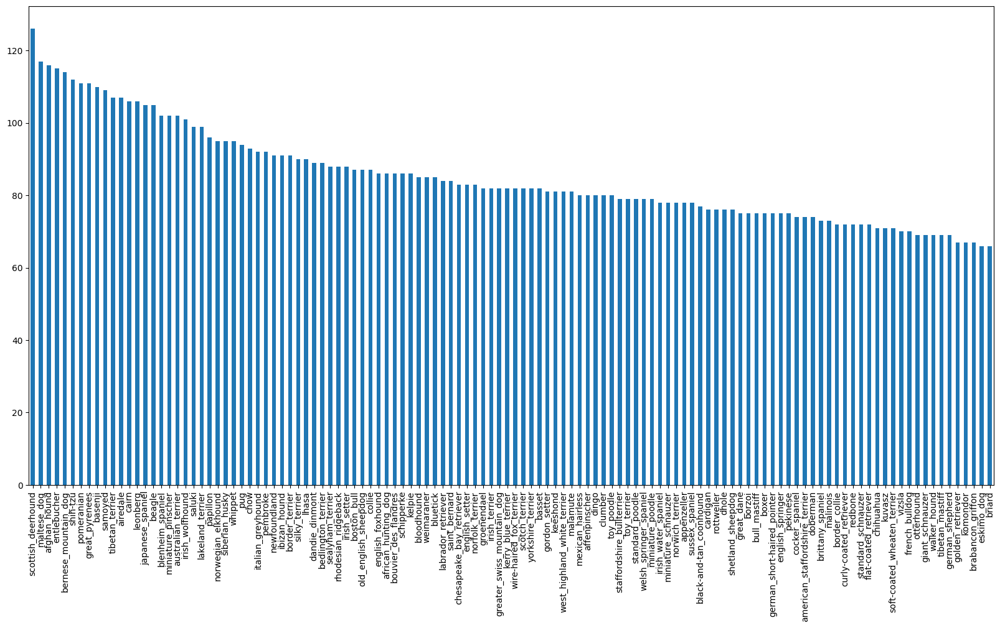

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

- Calculating the frequency count of each unique value in the "breed" column of the DataFrame.

- Visualizing the distribution of the breed labels using a bar plot with a specified figure size of (20,10).

In [ ]:
# What's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

- The code calculates the median frequency of occurrences of unique values in the "breed" column of the DataFrame

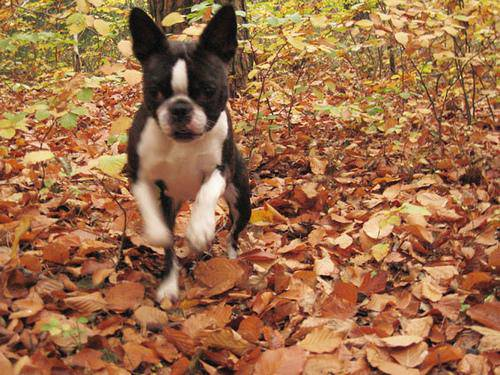

In [ ]:
# Sample image from the set
Image("/content/drive/MyDrive/ml/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

- It displays an image located at the specified file path using the Image class from IPython's display module

### **3.1 Getting images and their labels**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

### Filepaths

In [ ]:
filepaths = ["/content/drive/MyDrive/ml/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filepaths[:10]

['/content/drive/MyDrive/ml/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/ml/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/ml/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/ml/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/ml/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/ml/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/ml/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/ml/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/ml/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/ml/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

- The code creates a list of file paths by concatenating the base directory "/content/train/" with each file name in the "id" column of the DataFrame labels_csv, followed by the ".jpg" extension.

filepaths[:10]: This slices the filepaths list to display the first 10 elements.

In [ ]:
if len(os.listdir("/content/drive/MyDrive/ml/train/")) == len(filepaths):
  print("filepaths match actual amount of files")
else:
  print("filepaths do no match actual amount of files, check the target directory.")

filepaths match actual amount of files


- The code checks if the number of files in the directory "/content/drive/MyDrive/ml/train/" matches the number of file paths generated in the filepaths list.

### Labels

In [ ]:
labels = labels_csv["breed"]
labels.head()

0         boston_bull
1               dingo
2            pekinese
3            bluetick
4    golden_retriever
Name: breed, dtype: object

- The code extracts the "breed" column from the DataFrame labels_csv and assigns it to a new variable called labels.



In [ ]:
labels = np.array(labels)

- The code converts a Python list or pandas Series labels into a NumPy array.








In [ ]:
if len(filepaths) == len(labels):
  print("Labels match actual amount of files")
else:
  print("Labels do no match actual amount of files, check the target directory.")


Labels match actual amount of files


- The code checks if the number of file paths in the filepaths list matches the number of labels in the labels array.



In [ ]:
unique_labels = np.unique(labels)
unique_labels.size

120

- The code finds and counts the number of unique elements in the NumPy array labels.








In [ ]:
# Turning labels data into a boolean array - example with sigle lavel
labels[0] == unique_labels

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

- The code checks if the first element of the array labels is equal to any of the unique elements in the array unique_labels.

In [ ]:
# Turning every label into a boolean array
boolean_labels = np.array([label == unique_labels for label in labels])
boolean_labels.shape

(10222, 120)

- The code creates a boolean array where each row indicates whether a label matches a unique label.

- The shape of the resulting array indicates the number of labels and the number of unique labels.

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(boolean_labels == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([], dtype=int64), array([], dtype=int64))
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


- The code prints the original label, then identifies the index where this label occurs within the boolean array.

- It subsequently retrieves the corresponding row from the boolean array, converting it into integers where 1 represents the occurrence of the label and 0 represents absence.

In [ ]:
binary_labels = boolean_labels.astype(int)
binary_labels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

- The code snippet converts the boolean array boolean_labels into an integer array binary_labels, where True values are represented as 1 and False values are represented as 0.

### **3.2 Creating own validation set**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
X = np.array(filepaths)
y = binary_labels
X.shape, y.shape

((10222,), (10222, 120))

The code assigns the file paths stored in the filepaths list to the variable X and assigns the binary labels stored in the binary_labels array to the variable y.

In [ ]:
# to minimize the time between experiments, we will split our triaing data into smaller chunks, and encrease when needed

## **4. Data Splitting Section:**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10222, step: 1000}

- Defines a variable NUM_IMAGES with an initial value of 1000.

- Utilizes a parameter widget @param to allow interactive adjustment of the variable's value using a slider, bounded between 1000 and 10222 with a step size of 1000.

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

- Splits the input data X and labels y into training (X_train, y_train) and validation (X_val, y_val) sets.

- Utilizes train_test_split function from scikit-learn with a test size of 0.2 (20% of the data) and a specified random state of 42 for reproducibility.







### **4.1 Preprocessing Images(turning into tensors)**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
image = imread(filepaths[12])
image.shape

(299, 500, 3)

- Reads an image file specified by the 13th element (filepaths[12]) in the filepaths array.

- Retrieves and prints the shape of the image, indicating its dimensions and the number of color channels.

In [ ]:
image.max(), image.min()

(255, 0)

- Determines the maximum and minimum pixel intensity values present in the loaded image.

- Returns a tuple containing the maximum and minimum pixel intensity values found in the image.

In [ ]:
# tunrning into tensor - a Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[111,  56,  51],
        [106,  51,  46],
        [114,  59,  54],
        ...,
        [ 76,  25,  21],
        [ 76,  25,  21],
        [ 76,  25,  21]],

       [[100,  45,  40],
        [102,  47,  42],
        [108,  53,  48],
        ...,
        [ 75,  24,  20],
        [ 75,  24,  20],
        [ 75,  24,  20]]], dtype=uint8)>

- Converts the image data into a TensorFlow constant tensor, allowing it to be manipulated and processed within TensorFlow operations.

- The slicing operation [:2] extracts the first two elements of the tensor, enabling inspection of a subset of the tensor's data.

In [ ]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns it into a Tensor.
    # Read in an image file
    # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
    # Convert the colour channel values from 0-255 to 0-1 values
    # Resize the image to our desired value
  Args:
  image_path: string
  img_size: integer
  Returns:
  image in a Tensor form
  """
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

- The function process_image takes an image filepath as input and converts it
into a Tensor.

- It reads the image file using TensorFlow's tf.io.read_file function.

- The image is then decoded from JPEG format with 3 color channels (RGB) using tf.image.decode_jpeg.

- Next, the color channel values are normalized from the range of 0-255 to 0-1 using tf.image.convert_image_dtype.

- Finally, the image is resized to the desired dimensions specified by img_size using tf.image.resize.

- The processed image is returned as a Tensor.

### **4.2 Creating Data Batches**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)
In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.
* Batch size - number of samples hat will be passed through network at one time
* batch size != epoch (one single pass of all the data through network)
* larger baches = faster training, but also can affect the quality of the model.
* Also too large batch size may couse shortage of computation power on our machine, and would result in an error

In [ ]:
def get_image_label(image_path, label):
  """
  Takes an image path and corisponding label and process the image
  and returns tuple of (image, label)
  Args:
  image_path: string
  label: string
  Returns:
  tuple of image in a Tensor form and coresponding label (image,label)
  """
  image = process_image(image_path)
  return image, label

- The function get_image_label accepts an image path and its corresponding label as input.

- It processes the image using the process_image function and returns a tuple containing the processed image in tensor form and its corresponding label.







In [ ]:
BATCH_SIZE = 32
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, test_data=False, valid_data=False):
  """
  Creates a batches of data out of image and label pairs
  Shuffles the data if it's a training data, but doesn't shuffle when it's a validation data.
  Also accepts test data without labels
  """
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch


- The function create_data_batches generates batches of data from image and label pairs.

- If the data is for testing, it creates batches without shuffling and converts the images into tensors using the process_image function.

- If the data is for validation, it pairs each image with its corresponding label, converts them into tensors using the get_image_label function, and creates batches without shuffling.

- For training data, it pairs each image with its corresponding label, shuffles the data, converts them into tensors using the get_image_label function, and creates batches with the specified batch size.







In [ ]:
# Create training and validation batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


- Training data batches are created using the create_data_batches function with the training set (X_train, y_train).

- Validation data batches are created using the create_data_batches function with the validation set (X_val, y_val) and specifying valid_data=True.







In [ ]:
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int64, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int64, name=None)))


The element_spec attribute of a dataset provides information about the structure of each element within the dataset.

For train_data and valid_data:

- train_data.element_spec would specify that each element consists of a tuple containing an image tensor and its corresponding label string.

- valid_data.element_spec would have the same structure as train_data, indicating images and labels in each element of the validation dataset.

## **5. Data Visualization Section:**

### **5.1 Visualizing Data Batches**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
def show_25_images(images, labels):
  """
  Displays 25 images from data batch
  """
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    breed = unique_labels[(labels[i].argmax())]
    plt.title(breed)
    plt.axis("off")

- The function show_25_images creates a new figure for plotting with a size of 10x10 inches.

- It iterates over the first 25 elements of the images array, displaying each image along with its corresponding label.

- For each image, it determines the label by finding the index of the maximum value in the label array and sets the title of the subplot to the corresponding label.

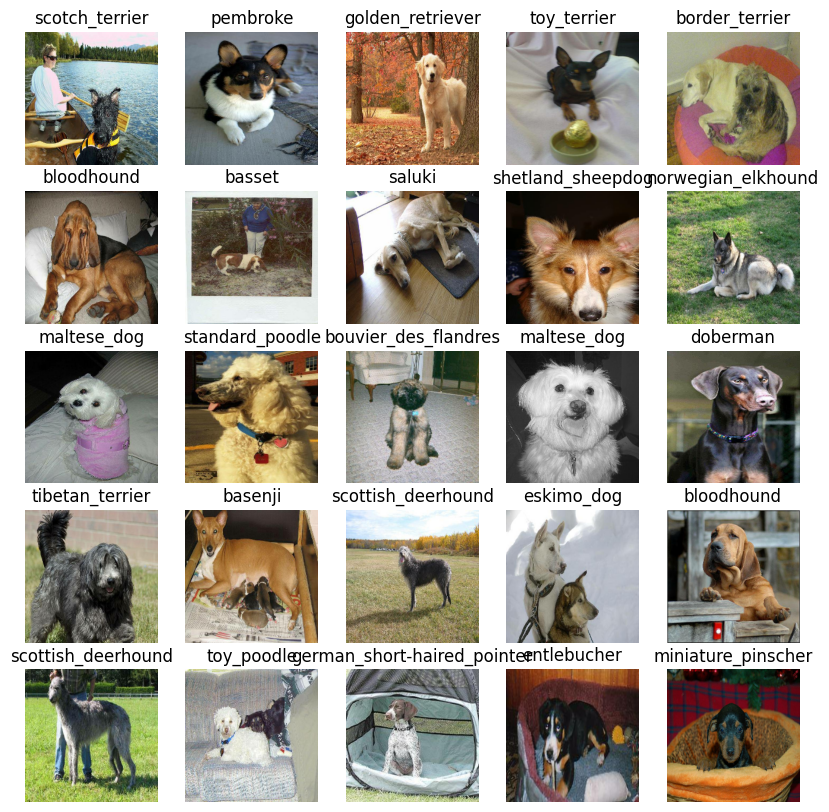

In [ ]:
# To make computation efficient, a batch is a collection of Tensors.
# So to view data in a batch, we've got to unwind it.
# We can do so by calling the as_numpy_iterator() method on a data batch.
# This will turn our a data batch into something which can be iterated over.
# Passing an iterable to next() will return the next item in the iterator.
# In our case, next will return a first batch of 32 images and label pairs.
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

- The code retrieves the first batch of images and labels from the training dataset using the next() function and the as_numpy_iterator() method.

- It then displays these images along with their corresponding labels using the show_25_images function.







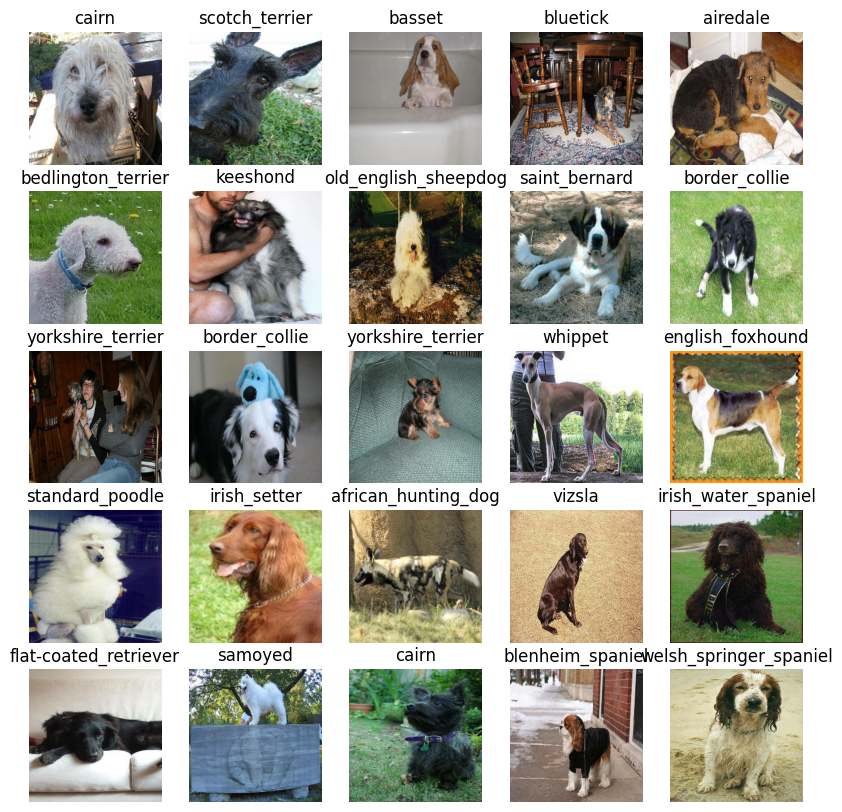

In [ ]:
# Visualize validation images from the validation data batch
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

- The code retrieves the first batch of images and labels from the validation dataset using the next() function and the as_numpy_iterator() method.

- It then displays these images along with their corresponding labels using the show_25_images function.

## **6. Model Initializing and Training Section**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
# input shape of a model - we pass it to the first layer in our model - for the rest of layers the input shape will be inderred
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # [batch_size, img_height, img_width, color_channels].
#  Batch size is left as None as this is inferred from the data we pass the model

OUTPUT_SHAPE = len(unique_labels)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

- INPUT_SHAPE defines the shape of the input data for the model, which includes batch size (variable), image height (IMG_SIZE), image width (IMG_SIZE), and number of color channels (3 for RGB).

- OUTPUT_SHAPE represents the number of classes in the classification task, which is determined by the length of the unique_labels array.

- MODEL_URL specifies the URL for the pre-trained MobileNetV2 model from TensorFlow Hub, which will be used for transfer learning.







In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # setup model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(model_url),
    # Dense is the most basic type of the layer, connects each input with each output node within the layer
    tf.keras.layers.Dense(units=output_shape, activation="softmax")
  ])

  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      # the models goal is to minimize this, getting to 0 means the model is learning perfectly.
      optimizer = tf.keras.optimizers.Adam(),
      # the optimizer is telling how to lower the loss function based on what model have done so far.
      # the Adam optimizer is a great general which performs well on most models.
      #  Other optimizers include RMSprop and Stochastic Gradient Descent.
      metrics=["accuracy"]
      # giving the accuracy of how well our model is predicting the correct image label
  )

  # tell our model what input shape it can expect.
  model.build(input_shape)

  return model


- The function create_model constructs a neural network model using a pre-trained MobileNetV2 model from TensorFlow Hub (model_url).

- It adds a Dense layer with softmax activation function to the model, connecting each input with each output node within the layer, resulting in output_shape number of units.

- The model is compiled with Categorical Crossentropy loss function, Adam optimizer, and accuracy metric.

- The input shape of the model is specified by input_shape, which defaults to INPUT_SHAPE.

- Finally, the model is built with the specified input shape and returned.

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


- The create_model function constructs a neural network model using a pre-trained MobileNetV2 model as a feature extractor and adds a Dense layer for classification.

- The model is compiled with appropriate loss function, optimizer, and metrics, and the input shape is inferred from the provided INPUT_SHAPE.

### **6.1 Creating callbacks**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
# Loding tensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


- The code loads the TensorBoard notebook extension, allowing you to visualize model training and evaluation metrics directly within the Jupyter Notebook environment.








In [ ]:
# TensorBoard callback to help tracking model learning progress
def create_tensorboard_callback():
  log_dir = os.path.join("/content/drive/MyDrive/ml/logs",  datetime.datetime.now().strftime("%d-%m-%Y-%H:%M:%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)


- The create_tensorboard_callback function creates a TensorBoard callback, which is used to track the model's learning progress during training.

- It generates a unique log directory path based on the current date and time, where TensorBoard logs will be saved.

In [ ]:
# Erly stopping callback to help stop training and prevent overfitting if a certain evaluation metrics stops improving
def create_early_stop_callback( monitor, patience=3):
  # patience - how many rounds of no improve before stopping
  # monitor - quantity to be monitored
  return tf.keras.callbacks.EarlyStopping(monitor=monitor, patience=patience)

- The create_early_stop_callback function creates an EarlyStopping callback, which is used to stop training if a certain evaluation metric stops improving.

- It takes two parameters: monitor, which specifies the quantity to be monitored (e.g., validation loss or accuracy), and patience, which determines how many rounds of no improvement before stopping training.







### **6.2 Training model on subset of data**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
# how many rounds of passing a data we want our model to do
NUM_EPOCHS = 50  #@param {type: "slider", max: 100, min: 1, step: 10}

- The code sets the number of epochs for training the model to 50, allowing the model to pass through the entire dataset 50 times during training. The parameter is adjustable via a slider with a range from 1 to 100 and a step size of 10.








In [ ]:
def train_model(x , y=None, monitor="val_accuracy"):
  model = create_model()
  tensorboard = create_tensorboard_callback()
  early_stopping = create_early_stop_callback(monitor=monitor)

  model.fit(callbacks=[tensorboard, early_stopping], validation_freq=1, epochs=NUM_EPOCHS, x=x, validation_data=y)

  return model

- The train_model function creates a neural network model using the create_model function.

- It sets up callbacks for TensorBoard logging and early stopping to track the model's learning progress and prevent overfitting.

- The model is trained using the fit method, with the provided data x and optional validation data y, along with the specified number of epochs (NUM_EPOCHS).







In [ ]:
model = train_model(x=train_data, y=valid_data)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/50
25/25 [==============================] - 8s 169ms/step - loss: 4.5669 - accuracy: 0.0962 - val_loss: 3.3960 - val_accuracy: 0.2650
Epoch 2/50
25/25 [==============================] - 5s 188ms/step - loss: 1.6371 - accuracy: 0.6812 - val_loss: 2.1705 - val_accuracy: 0.4950
Epoch 3/50
25/25 [==============================] - 4s 165ms/step - loss: 0.5727 - accuracy: 0.9275 - val_loss: 1.6930 - val_accuracy: 0.5850
Epoch 4/50
25/25 [==============================] - 5s 187ms/step - loss: 0.2502 - accuracy: 0.9887 - val_loss: 1.5199 - val_accuracy: 0.6200
Epoch 5/50
25/25 [==============================] - 4s 141ms/step - loss: 0.1452 - accuracy: 0.9950 - val_loss: 1.4335 - val_accuracy: 0.6250
Epoch 6/50
25/25 [==============================] - 4s 139ms/step - loss: 0.1001 - accuracy: 0.9987 - val_loss: 1.3952 - val_accuracy: 0.6500
Epoch 7/50
25/25 [==============================] - 5s 

- The code model = train_model(x=train_data, y=valid_data) trains a neural network model using training data train_data and validation data valid_data.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/ml/logs


Reusing TensorBoard on port 6006 (pid 3634), started 0:28:47 ago. (Use '!kill 3634' to kill it.)

<IPython.core.display.Javascript object>

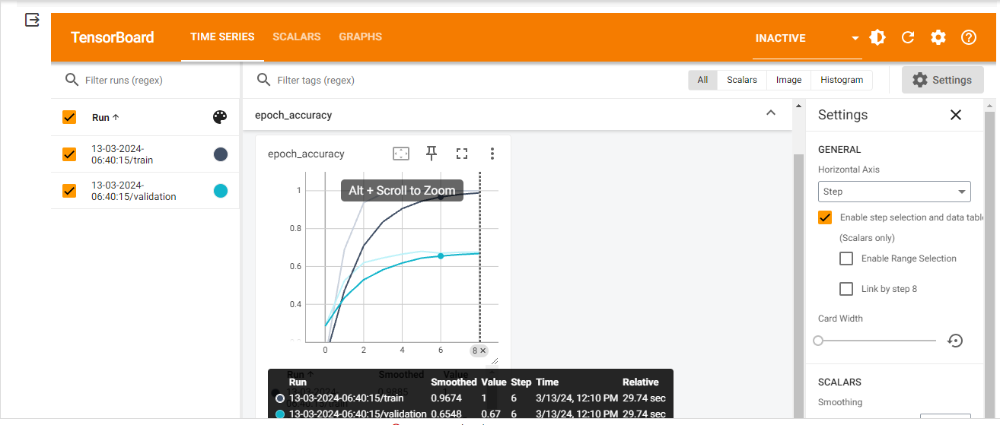

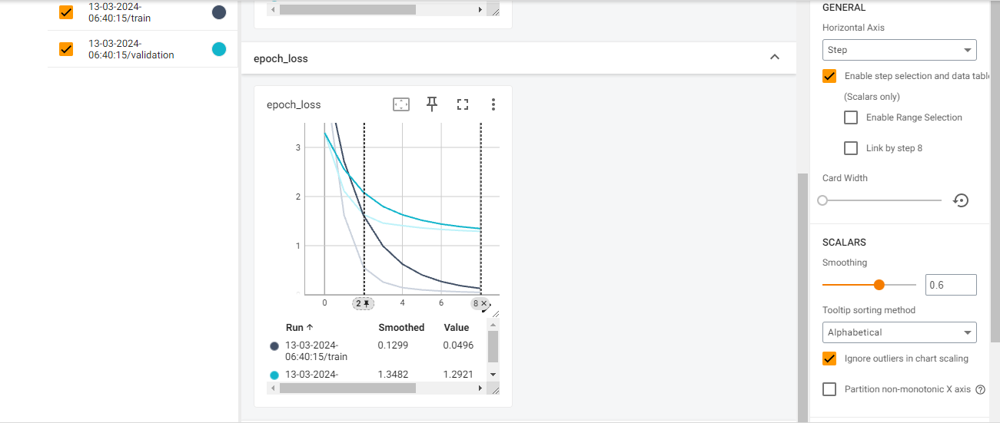

- The %tensorboard --logdir /content/drive/MyDrive/ml/logs command launches TensorBoard to visualize logs stored in the directory /content/drive/MyDrive/ml/logs.

## **7. Model Inference Section**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 6s 145ms/step


array([[2.1543393e-03, 3.5370722e-05, 4.6899458e-04, ..., 1.2542318e-04,
        2.8065795e-05, 2.4516829e-03],
       [2.0495006e-03, 2.0378563e-03, 3.2969553e-02, ..., 5.9531833e-04,
        3.0881807e-03, 1.8328108e-04],
       [2.6551343e-06, 9.1649228e-05, 1.6190646e-05, ..., 1.2739370e-05,
        1.7591850e-05, 6.6400258e-05],
       ...,
       [1.5731368e-06, 5.7334277e-05, 4.8596617e-06, ..., 3.3808578e-07,
        3.4373428e-05, 2.9951090e-05],
       [5.8445581e-03, 4.4436725e-05, 8.2512306e-05, ..., 5.5256427e-05,
        3.4778874e-05, 1.6019775e-02],
       [2.7131068e-04, 1.2734813e-05, 5.5209600e-04, ..., 2.3787522e-03,
        1.0909906e-03, 5.2401090e-05]], dtype=float32)

- The code uses the trained model to make predictions on the validation data (valid_data) using the predict method.

- The verbose=1 parameter specifies that progress updates should be displayed during prediction.

- The predictions are stored in the predictions variable, providing the model's predicted probabilities for each class for each sample in the validation data.

In [ ]:
predictions[0]

array([2.15433934e-03, 3.53707219e-05, 4.68994578e-04, 1.68943516e-05,
       5.38700086e-04, 4.40990698e-05, 5.72169349e-02, 1.23108985e-04,
       6.30221766e-05, 1.55985865e-04, 1.41075187e-04, 8.26686519e-05,
       6.24257373e-05, 8.46587864e-05, 8.01794464e-04, 1.66277285e-03,
       5.50975565e-05, 1.83575451e-01, 9.45967986e-06, 2.36222768e-05,
       1.09432405e-03, 6.87491774e-05, 1.12941707e-05, 1.48413412e-03,
       1.83680695e-05, 1.28627667e-04, 1.82920113e-01, 9.98110045e-06,
       1.09318236e-03, 4.15426912e-04, 1.31480469e-04, 8.04956362e-04,
       7.35603389e-05, 1.06272222e-04, 9.45888241e-05, 1.15148118e-02,
       3.58172256e-05, 1.44033897e-04, 2.38031222e-04, 1.61299613e-04,
       1.30232109e-03, 1.09972396e-04, 9.78302269e-05, 2.57241103e-04,
       1.19348588e-05, 1.80922609e-04, 1.88730919e-05, 1.87823287e-04,
       1.42266697e-04, 4.68425933e-05, 6.16619291e-05, 2.66802326e-05,
       1.64629499e-04, 1.90801715e-04, 1.54386085e-04, 3.17910999e-05,
      

- Accessing predictions[0] retrieves the first prediction from the array of predictions generated by the model. This represents the model's output for the first sample in the validation data.







In [ ]:
predictions[0].sum()


1.0

- The expression predictions[0].sum() calculates the sum of all elements in the first prediction array, providing a cumulative measure of the model's output for the first sample in the validation data.

In [ ]:
index = 78
print(predictions[index])
print(f"Max prediction probability (confidence levels): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Label: {unique_labels[np.argmax(predictions[index])]}")

[4.49842810e-05 4.55924601e-04 3.54742748e-04 1.49997741e-05
 1.85847341e-04 2.31967817e-04 5.97924110e-04 7.35661481e-04
 1.69964023e-05 2.77423346e-03 1.45431666e-04 6.43842077e-06
 1.71284075e-04 4.40517324e-05 6.27947971e-03 1.50767592e-05
 2.42623981e-04 2.66754039e-04 5.55707484e-05 3.21748696e-04
 3.08152194e-05 1.97095840e-04 5.91971038e-04 1.50247492e-04
 1.47810597e-05 3.71026061e-03 1.32188364e-03 1.81738730e-03
 1.31668733e-03 2.42053485e-03 9.79721608e-06 2.43569302e-05
 1.84568737e-04 9.16273159e-04 5.95519959e-05 3.24444663e-05
 6.09157258e-04 1.41014962e-03 4.30092448e-04 2.28235192e-04
 2.06842058e-04 9.03307300e-05 8.84427718e-05 2.85151764e-04
 4.42416378e-04 2.24798525e-04 1.59043656e-03 1.65530146e-04
 4.53978864e-05 1.96167792e-04 1.04132023e-05 1.73999011e-04
 1.10628298e-05 2.76269293e-05 5.80163789e-04 1.29387369e-02
 3.12047814e-05 1.63518678e-04 9.33027186e-04 2.56062194e-04
 7.26369617e-04 1.09322546e-05 3.15122015e-04 7.99183035e-05
 5.79900152e-05 3.998122

- The code retrieves the prediction probabilities for the sample at index 78 from the predictions array, which represents the confidence levels of the model for each class.

- It then prints the maximum prediction probability (highest confidence level) among all classes for the given sample.

- Additionally, it calculates the sum of all prediction probabilities, identifies the index of the class with the highest probability, and prints the corresponding label from the unique_labels array.

In [ ]:
### Showing the image the prediction is beeing made of
def get_predict_label(prediction_probabilities):
  """
  turns probabilityies into their respective label
  """
  return unique_labels[np.argmax(prediction_probabilities)]

- The function get_predict_label takes prediction probabilities as input and returns the corresponding label based on the class with the highest probability.

In [ ]:
get_predict_label(predictions[112])

'dhole'

- The code get_predict_label(predictions[112]) calculates the label predicted by the model for the image at index 112 in the validation data.


In [ ]:
# function to unbatch a batched dataset
def unbatchify(dataset):
  """
  Takes a batched dataset of image and label Tensors and return
  separate arrays of images and labels
  """
  images, labels = [], []
  for image, label in dataset.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(get_predict_label(label))
  return images, labels


- The unbatchify function takes a batched dataset of image and label tensors as input.

- It iterates through the dataset, unbatching it and converting each image and label pair into separate arrays, where images are stored as NumPy arrays and labels are obtained using the get_predict_label function.







In [ ]:
valid_images, valid_labels = unbatchify(valid_data)


- The code applies the unbatchify function to the valid_data dataset, separating the batched dataset into individual arrays of images (valid_images) and their corresponding labels (valid_labels).

## **7.1 Visualizing model predictions**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)
At this point we have:
* Prediction labels
* Validation labels
* Validation images

We'll create a function which takes an array of prediction probabilities, array of truth labels, and array of images.
Then we'll convert prediction probabilities into prediction labels
and plot the predicted label, it's predicted probability, the truth label, and image on the same plot ![alt text](https://)

In [ ]:
def plot_pred(prediction_probabilities, images, thruth_labels, index=98):
  """
  View the prediction, ground truth and image for sample n.
  Args:
  prediction_probabilities - array of prediction probabilities,
  images - array of images
  thruth_labels -  array of truth labels

  Converts prediction probabilities into prediction labels and plot the predicted label,
  it's predicted probability, the truth label, and image on the same plot
  """
  prediction_probability, image, truth_label = prediction_probabilities[index], images[index], thruth_labels[index]
  prediction_label = get_predict_label(prediction_probability)


  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the title color depending if the prediction is right or worng
  if prediction_label == truth_label:
    color="green"
  else:
    color="red"

  # Change plot title
  plt.title(f"{prediction_label} {100 * np.max(prediction_probability):+.2f}% {truth_label}", color=color, loc="center")



- The plot_pred function visualizes the prediction, ground truth, and image for a given sample.

- It takes arrays of prediction probabilities (prediction_probabilities), images (images), and truth labels (truth_labels) as input.

- It selects the prediction probability, image, and truth label corresponding to the specified index, then converts the prediction probabilities into a prediction label using the get_predict_label function.







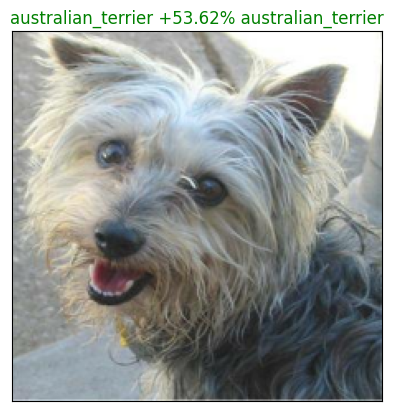

In [ ]:
plot_pred(prediction_probabilities=predictions, images=valid_images, thruth_labels=valid_labels )

Viewing model 10 top predictions

In [ ]:
def plot_pred_confidence(prediction_probabilities, labels, index):
  prediction_probability, label = prediction_probabilities[index] , labels[index]
  prediction_label = get_predict_label(prediction_probability)

  #getting top ten indexes of highest probabilities
  top_10_pred_indexes = prediction_probability.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = prediction_probability[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == label)].set_color("green")
  else:
    pass


- The function visualizes the prediction confidence levels for the top 10 predicted labels based on the input prediction probabilities.

- It highlights the true label if it is within the top 10 predictions by coloring its corresponding bar green.

- The plot is set up using a bar chart, with each bar representing the confidence level for a predicted label.







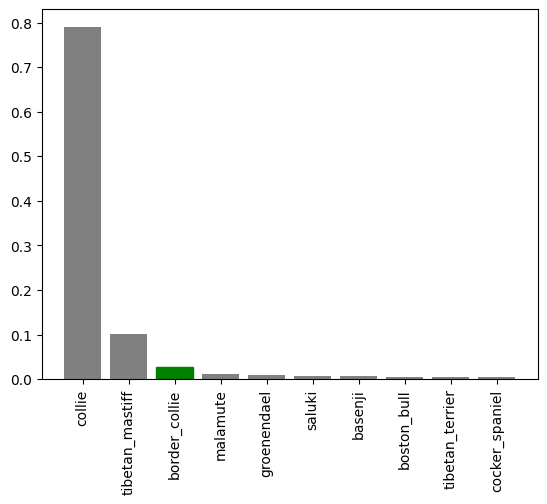

In [ ]:
plot_pred_confidence(prediction_probabilities=predictions,
               labels=valid_labels,
               index=9)

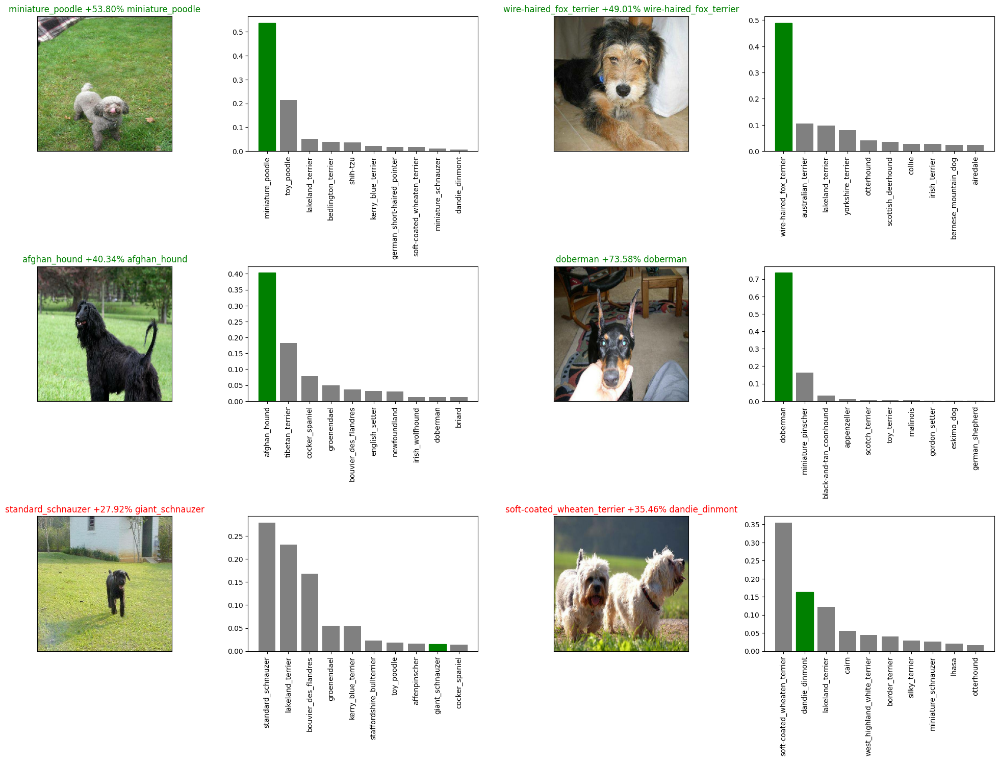

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 60
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            thruth_labels=valid_labels,
            images=valid_images,
            index=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_confidence(prediction_probabilities=predictions,
                 labels=valid_labels,
                 index=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

- The code visualizes predictions and their confidence levels for multiple samples from the validation set:

- It defines parameters for grid layout and image selection.
For each image:
It plots the image alongside the prediction and ground truth label.
It plots the prediction confidence levels for the top predictions.
Finally, it displays the grid of plots.

## **7.2 Saving model**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/ml/models",
                          datetime.datetime.now().strftime("%d-%m-%Y-%H:%M:%S"))
  model_path = f"{modeldir}-{suffix}.h5"

  print(f"Saving model to {model_path}")
  model.save(model_path)
  return model_path


- The save_model function saves the provided model to a specified directory.

- It constructs a directory path based on the current date and time using datetime.datetime.now().strftime("%d-%m-%Y-%H:%M:%S").

- The saved model is stored in HDF5 format with a filename that includes the current timestamp and an optional suffix. The file path of the saved model is returned.

In [ ]:
def load_model(model_path):
  print(f"Loading saved model from {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


- The load_model function loads a saved model from the specified model_path.

- It prints a message indicating the path from which the model is being loaded.

- The model is loaded using tf.keras.
models.load_model, with custom objects specified to correctly load the TensorFlow Hub KerasLayer.

In [ ]:
# save our model
model_path = save_model(model, suffix="1000-images")
model.evaluate(valid_data)

Saving model to /content/drive/MyDrive/ml/models/14-03-2024-06:57:34-1000-images.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 125ms/step - loss: 1.2646 - accuracy: 0.6850


[1.2645546197891235, 0.6850000023841858]

-  This code saves the trained model with the specified suffix ("1000-images") and evaluates its performance on the validation data. Here's a brief explanation:

- It calls the save_model function to save the model with the specified suffix.
It stores the path where the model is saved in the variable model_path.
It evaluates the model's performance on the validation data using the evaluate method with valid_data.

In [ ]:
reloaded_model = load_model(model_path=model_path)
reloaded_model.evaluate(valid_data)

Loading saved model from /content/drive/MyDrive/ml/models/14-03-2024-06:57:34-1000-images.h5
7/7 [==============================] - 1s 103ms/step - loss: 1.2646 - accuracy: 0.6850


[1.2645546197891235, 0.6850000023841858]

- The code reloads the model from the saved path and evaluates its performance on the validation data.








### **7.3 Making prediction on custom images**
#### [Back to table of contents](#scrollTo=duuQ6AX8ZL89)

In [ ]:
custom_path = "/content/drive/MyDrive/ml/custom_images/"
custom_images_path = [custom_path + file_name for file_name in os.listdir(custom_path)]
custom_images_path

['/content/drive/MyDrive/ml/custom_images/Dhole.jpg',
 '/content/drive/MyDrive/ml/custom_images/plot.png',
 '/content/drive/MyDrive/ml/custom_images/Pembroke.jfif',
 '/content/drive/MyDrive/ml/custom_images/boston bull.jfif']

- This code constructs a list of file paths for custom images located in the directory /content/drive/MyDrive/ml/custom_images/. Each file path is created by concatenating the directory path with the individual file names obtained using os.listdir(custom_path).


In [ ]:
custom_data_batches = create_data_batches(custom_images_path, test_data=True)
custom_data_batches

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

- The create_data_batches function is used to create data batches from a custom set of images located at custom_images_path.

- Since test_data is set to True, the function creates batches without shuffling, as these images are intended for testing or prediction purposes.

In [ ]:
custom_data_preds = model.predict(custom_data_batches, verbose=1)
custom_data_preds.shape

1/1 [==============================] - 1s 1s/step


(4, 120)

- The code custom_data_preds = model.predict(custom_data_batches, verbose=1) generates predictions using model on the custom data batches. These predictions are stored in the variable custom_data_preds.

- The custom_data_preds.shape command then retrieves the shape of the predictions array, indicating the number of samples and the number of prediction classes.







In [ ]:
custom_data_labels = [get_predict_label(custom_data_preds[i]) for i in range(len(custom_data_preds))]
custom_data_labels

['dhole', 'dhole', 'shetland_sheepdog', 'boston_bull']

- The code utilizes the trained model (model) to make predictions on a custom set of images represented by custom_data_batches.

- The verbose=1 parameter specifies that progress updates should be displayed during prediction, and the shape of the predictions array (custom_data_preds) is printed to indicate the dimensions of the prediction results.

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data_batches.unbatch().as_numpy_iterator():
  custom_images.append(image)

- The code iterates through the unbatched custom data batches and appends each image to the custom_images list.

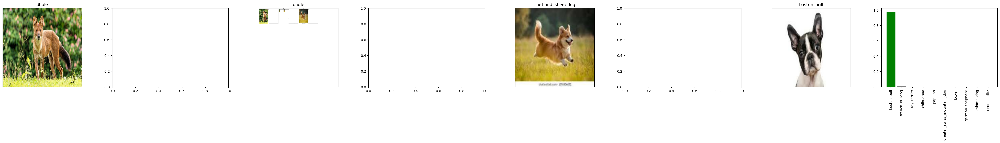

In [ ]:
num_rows = 5
num_cols = 4
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i, image in enumerate(custom_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_data_labels[i])
  plt.imshow(image)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
plot_pred_confidence(prediction_probabilities=custom_data_preds, labels=custom_data_labels, index=i)

plt.tight_layout(h_pad=1.0)
plt.savefig('/content/drive/MyDrive/ml/custom_images/plot.png')


- The code creates a grid of subplots to display custom images and their corresponding prediction confidences.

- It iterates over the custom images, plotting each image with its label in the left subplot and its prediction confidence levels in the right subplot.

- The layout of the subplots is adjusted for better visualization, and the entire plot is saved as an image file.







In [ ]:
def plot_pred_confidence(prediction_probabilities, index):
  prediction_probability = prediction_probabilities[index]
  prediction_label = get_predict_label(prediction_probability)

  #getting top ten indexes of highest probabilities
  top_10_pred_indexes = prediction_probability.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = prediction_probability[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")



- The function plot_pred_confidence visualizes prediction confidence levels for a specific prediction. Here's a brief explanation:

- It takes two parameters: prediction_probabilities (an array of prediction probabilities) and index (the index of the prediction to visualize).

- It retrieves the prediction probability for the specified index.

- It identifies the top 10 indexes with the highest prediction probabilities.

- It obtains the corresponding confidence values and labels for these top predictions.

- It sets up a bar plot to visualize the top prediction confidence values alongside their labels.

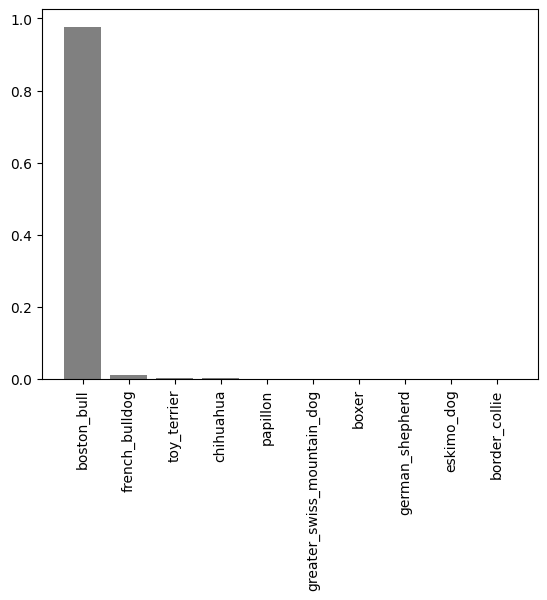

In [ ]:
plot_pred_confidence(prediction_probabilities=custom_data_preds,
               index=3)

- The code plot_pred_confidence(prediction_probabilities=custom_data_preds, index=0) visualizes the prediction confidence levels for the first prediction in the custom_data_preds array.





